## Sheet #6: Maximizing Nongaussianity - Luke Longren & Angela Mitrovska 

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io as sio
from numpy import linalg as LA
from matplotlib.ticker import FuncFormatter, MultipleLocator
import matplotlib.gridspec as gridspec
import seaborn as sns
import pandas as pd
from scipy.stats import norm
from scipy.stats import multivariate_normal as mnorm

In [2]:
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')
plt.rcParams.update({'font.size': 12})
plt.rcParams["figure.figsize"] = (18,10)

## Exercise 6.1: Kurtosis of Toy Data

In [3]:
toy_data = sio.loadmat(r'C:\Users\lcube\Desktop\jupyter\BCCN\MI2\given\sheet6\distrib.mat')
uniform_data = toy_data['uniform']
normal_data = toy_data['normal']
laplacian_data = toy_data['laplacian']
print(np.shape(uniform_data), np.shape(normal_data), np.shape(laplacian_data))

(2, 10000) (2, 10000) (2, 10000)


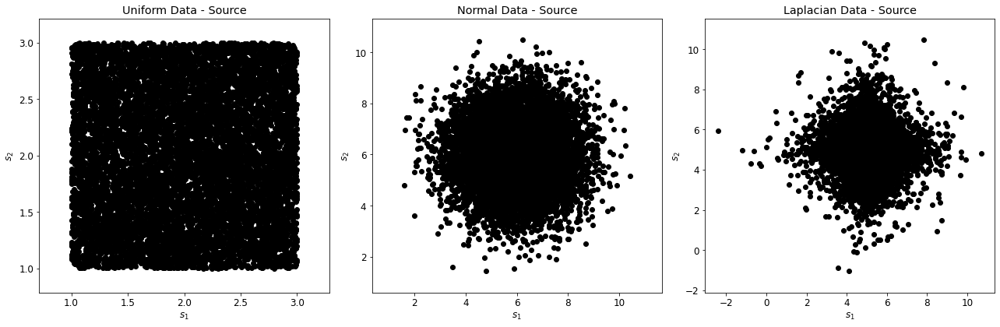

In [4]:
fig, axs = plt.subplots(1,3, figsize=(18, 6))
axs[0].scatter(uniform_data[0], uniform_data[1], color='k')
axs[1].scatter(normal_data[0], normal_data[1], color='k')
axs[2].scatter(laplacian_data[0], laplacian_data[1], color='k')
axs[0].set_title('Uniform Data - Source'), axs[1].set_title('Normal Data - Source'), axs[2].set_title('Laplacian Data - Source')
axs[0].set_xlabel('$s_1$'), axs[1].set_xlabel('$s_1$'), axs[2].set_xlabel('$s_1$')
axs[0].set_ylabel('$s_2$'), axs[1].set_ylabel('$s_2$'), axs[2].set_ylabel('$s_2$')
axs[0].set_aspect('equal', 'datalim'), axs[1].set_aspect('equal', 'datalim'), axs[2].set_aspect('equal', 'datalim')
plt.tight_layout()
plt.show()

### (a) Apply the following mixing matrix $\bar{A}$ to the original sources $\bar{s}$:

## <font color='black'> $ \bar{A} = \begin{bmatrix} 4 & 3 \\ 2 & 1 \end{bmatrix} \ \ \ \ \bar{x} = \bar{A} \bar{s} $  

In [5]:
A = np.array([[4, 3], [2, 1]])  # mixing array
uniform_mixed = A @ uniform_data
normal_mixed = A @ normal_data
laplacian_mixed = A @ laplacian_data
print(np.shape(uniform_mixed), np.shape(normal_mixed), np.shape(laplacian_mixed))

(2, 10000) (2, 10000) (2, 10000)


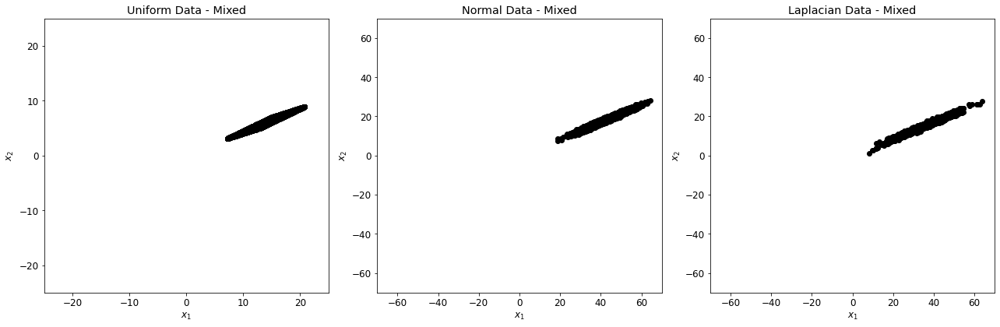

In [6]:
fig, axs = plt.subplots(1,3, figsize=(18, 6))
axs[0].scatter(uniform_mixed[0], uniform_mixed[1], color='k')
axs[1].scatter(normal_mixed[0], normal_mixed[1], color='k')
axs[2].scatter(laplacian_mixed[0], laplacian_mixed[1], color='k')
axs[0].set_title('Uniform Data - Mixed'), axs[1].set_title('Normal Data - Mixed'), axs[2].set_title('Laplacian Data - Mixed')
axs[0].set_xlabel('$x_1$'), axs[1].set_xlabel('$x_1$'), axs[2].set_xlabel('$x_1$')
axs[0].set_ylabel('$x_2$'), axs[1].set_ylabel('$x_2$'), axs[2].set_ylabel('$x_2$')
axs[0].set_xlim(-25, 25), axs[1].set_xlim(-70, 70), axs[2].set_xlim(-70, 70)
axs[0].set_ylim(-25, 25), axs[1].set_ylim(-70, 70), axs[2].set_ylim(-70, 70)
#axs[0].set_aspect('equal', 'datalim'), axs[1].set_aspect('equal', 'datalim'), axs[2].set_aspect('equal', 'datalim')
plt.tight_layout()
plt.show()

### (b) Center the mixtures $x$ to zero mean.

In [7]:
uniform_mean = np.mean(uniform_mixed, axis=1)
normal_mean = np.mean(normal_mixed, axis=1)
laplacian_mean = np.mean(laplacian_mixed, axis=1)
uniform_centered = [uniform_mixed[0] - uniform_mean[0], uniform_mixed[1] - uniform_mean[1]]
normal_centered = [normal_mixed[0] - normal_mean[0], normal_mixed[1] - normal_mean[1]]
laplacian_centered = [laplacian_mixed[0] - laplacian_mean[0], laplacian_mixed[1] - laplacian_mean[1]]
print(np.shape(uniform_centered), np.shape(normal_centered), np.shape(laplacian_centered))

(2, 10000) (2, 10000) (2, 10000)


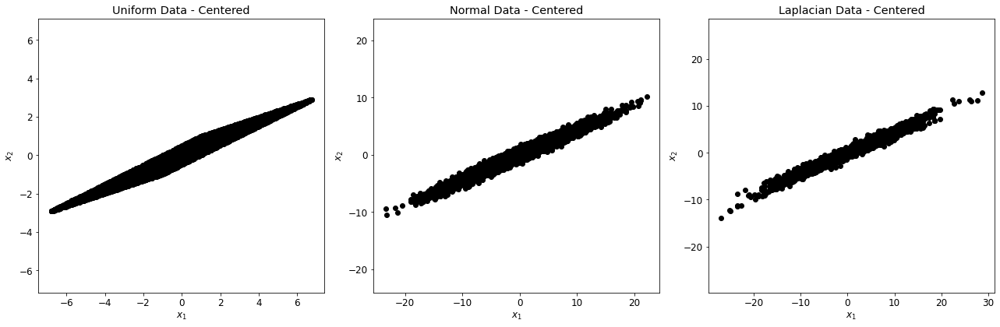

In [8]:
fig, axs = plt.subplots(1,3, figsize=(18, 6))
axs[0].scatter(uniform_centered[0], uniform_centered[1], color='k')
axs[1].scatter(normal_centered[0], normal_centered[1], color='k')
axs[2].scatter(laplacian_centered[0], laplacian_centered[1], color='k')
axs[0].set_title('Uniform Data - Centered'), axs[1].set_title('Normal Data - Centered'), axs[2].set_title('Laplacian Data - Centered')
axs[0].set_xlabel('$x_1$'), axs[1].set_xlabel('$x_1$'), axs[2].set_xlabel('$x_1$')
axs[0].set_ylabel('$x_2$'), axs[1].set_ylabel('$x_2$'), axs[2].set_ylabel('$x_2$')
axs[0].set_aspect('equal', 'datalim'), axs[1].set_aspect('equal', 'datalim'), axs[2].set_aspect('equal', 'datalim')
plt.tight_layout()
plt.show()

### (c) Decorrelate the mixtures from (b) by applying principal component analysis (PCA) on them and project them onto the PCs.

Steps for PCA (was hazy on this before):  
-After centering, measure covariances  
-Construct the covariance matrix  
-Eigenvalue decomposition  
-Order eigenvalues in descending order, highest variance first  
-Project input onto the PCs  

In [9]:
def PCA(data):
    cov = np.cov(data, rowvar=True)  # measure covariances, construct the matrix
    eigenvalues, eigenvectors = LA.eig(cov)  # eigenvalue decomposition
    eigenvectors_sorted = np.sort(eigenvectors)[::-1]
    PCs = eigenvectors_sorted @ data  # project input onto the PCs
    return PCs

In [10]:
uniform_PCA = PCA(uniform_centered)
normal_PCA = PCA(normal_centered)
laplacian_PCA = PCA(laplacian_centered)
#uniform_PCA = [uniform_centered[0] + uniform_centered[1], uniform_centered[0] - uniform_centered[1]]
print(np.shape(uniform_PCA), np.shape(normal_PCA), np.shape(laplacian_PCA))

(2, 10000) (2, 10000) (2, 10000)


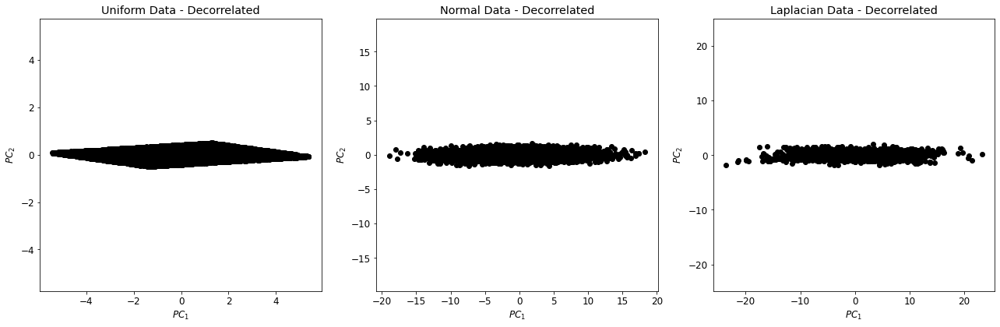

In [11]:
fig, axs = plt.subplots(1,3, figsize=(18, 6))
axs[0].scatter(uniform_PCA[0], uniform_PCA[1], color='k')
axs[1].scatter(normal_PCA[0], normal_PCA[1], color='k')
axs[2].scatter(laplacian_PCA[0], laplacian_PCA[1], color='k')
axs[0].set_title('Uniform Data - Decorrelated'), axs[1].set_title('Normal Data - Decorrelated'), axs[2].set_title('Laplacian Data - Decorrelated')
axs[0].set_xlabel('$PC_1$'), axs[1].set_xlabel('$PC_1$'), axs[2].set_xlabel('$PC_1$')
axs[0].set_ylabel('$PC_2$'), axs[1].set_ylabel('$PC_2$'), axs[2].set_ylabel('$PC_2$')
axs[0].set_aspect('equal', 'datalim'), axs[1].set_aspect('equal', 'datalim'), axs[2].set_aspect('equal', 'datalim')
plt.tight_layout()
plt.show()

### (d) Scale the decorrelated mixtures from (c) to unit variance in each PC direction. The mixtures are now $whitened \ (sphered)$.

In [12]:
uniform_whitened = [uniform_PCA[0] / np.std(uniform_PCA[0]), uniform_PCA[1] / np.std(uniform_PCA[1])]
normal_whitened = [normal_PCA[0] / np.std(normal_PCA[0]), normal_PCA[1] / np.std(normal_PCA[1])]
laplacian_whitened = [laplacian_PCA[0] / np.std(laplacian_PCA[0]), laplacian_PCA[1] / np.std(laplacian_PCA[1])]
print(np.shape(normal_whitened), np.shape(uniform_whitened), np.shape(laplacian_whitened))
print(np.var(uniform_whitened, axis=1), np.var(normal_whitened, axis=1), np.var(laplacian_whitened, axis=1))

(2, 10000) (2, 10000) (2, 10000)
[1. 1.] [1. 1.] [1. 1.]


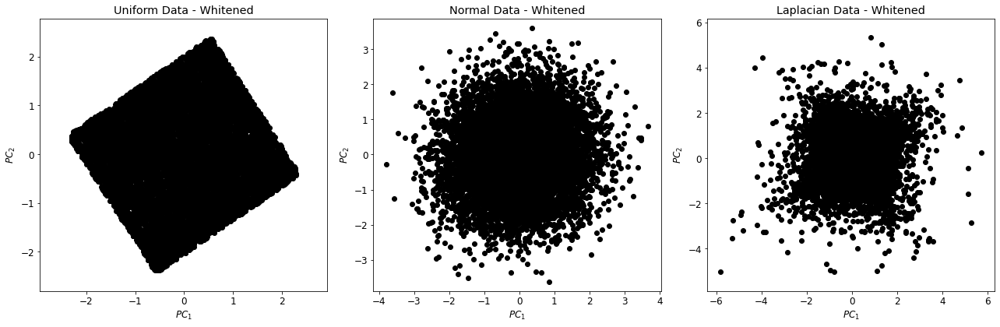

In [13]:
fig, axs = plt.subplots(1,3, figsize=(18, 6))
axs[0].scatter(uniform_whitened[0], uniform_whitened[1], color='k')
axs[1].scatter(normal_whitened[0], normal_whitened[1], color='k')
axs[2].scatter(laplacian_whitened[0], laplacian_whitened[1], color='k')
axs[0].set_title('Uniform Data - Whitened'), axs[1].set_title('Normal Data - Whitened'), axs[2].set_title('Laplacian Data - Whitened')
axs[0].set_xlabel('$PC_1$'), axs[1].set_xlabel('$PC_1$'), axs[2].set_xlabel('$PC_1$')
axs[0].set_ylabel('$PC_2$'), axs[1].set_ylabel('$PC_2$'), axs[2].set_ylabel('$PC_2$')
axs[0].set_aspect('equal', 'datalim'), axs[1].set_aspect('equal', 'datalim'), axs[2].set_aspect('equal', 'datalim')
plt.tight_layout()
plt.show()

### (e) Rotate the whitened mixtures by different angles $θ$.

## <font color='black'> $ \bar{x}_{\theta} = \bar{R}_{\theta} \bar{x} = \begin{pmatrix} cos(\theta) & -sin(\theta) \\ sin(\theta) & cos(\theta) \end{pmatrix} \bar{x}, \ \ \ \ \theta = 0, \frac{\pi}{50},...,2\pi $  

In [14]:
R_theta = lambda theta: np.array([[np.cos(theta), -np.sin(theta)], [np.sin(theta), np.cos(theta)]])
theta = np.arange(0, 2*np.pi, np.pi/50)
"""
at this point, I realize that I could have done everything before this point
in a third the lines of code, but decide I am too sad to change that
"""
x_theta = [R_theta(i) @ [uniform_whitened, normal_whitened, laplacian_whitened] for i in theta]
print(np.shape(x_theta))  # 100 thetas, 3 data sets, 2 sources, 10k points 

(100, 3, 2, 10000)


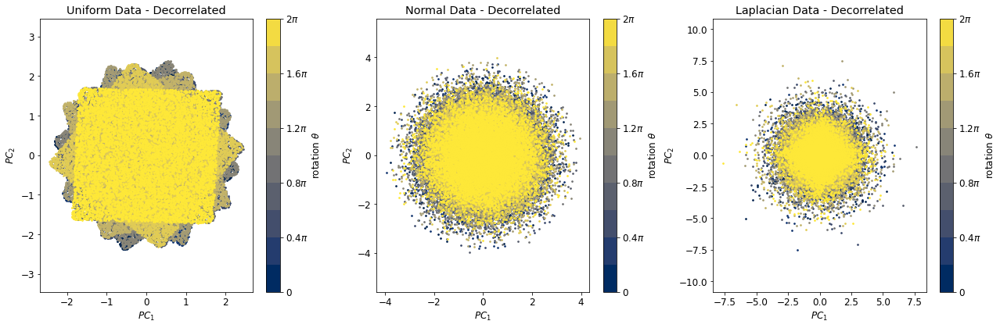

In [15]:
fig, axs = plt.subplots(1,3, figsize=(18, 6))
whitened_titles = ['Uniform Data - Decorrelated', 'Normal Data - Decorrelated', 'Laplacian Data - Decorrelated']
for i in range(np.shape(x_theta)[1]):  # loop over data sets
    cmap = plt.cm.cividis
    theta_num = len(theta)//10
    color = iter(cmap(np.linspace(0, 1, theta_num)))
    for j in range(theta_num):  # loop over a tenth of the thetas
        c = next(color)
        axs[i].scatter(x_theta[j*10][i][0], x_theta[j*10][i][1], color=c, s=2**1.5)
    norm = plt.cm.colors.Normalize(vmin=0, vmax=2*np.pi)     
    cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), boundaries=np.linspace(0, 2*np.pi, theta_num+1), ax=axs[i])
    cbar.ax.set_yticklabels(['{:.2g}$\pi$'.format(2*theta[k*10]/np.pi) if theta[k*10] != 0 else '0' for k in range(theta_num)])
    cbar.ax.set_ylabel(r'rotation $\theta$')
    axs[i].set_title(whitened_titles[i])
    axs[i].set_xlabel('$PC_1$')
    axs[i].set_ylabel('$PC_2$')
    axs[i].set_aspect('equal', 'datalim')
plt.tight_layout()
plt.show()

### Calculate the (excess) kurtosis$^2$ empirically for each dimension in $\bar{x}$.

## <font color='black'> $kurt(x_{\theta}) = \langle x_{\theta}^4 \rangle - 3 \langle x_{\theta}^2 \rangle ^2 = \langle x_{\theta}^4 \rangle - 3$

In [16]:
kurt = lambda x_theta: np.mean(x_theta ** 4) - 3
kurtosis = np.zeros((np.shape(x_theta)[1], np.shape(x_theta)[2], len(theta)))  # data, sources, theta
for i in range(np.shape(x_theta)[1]):  # loop over data sets
    for j in range(np.shape(x_theta)[2]):  # loop over source number
        for k in range(len(theta)):  # loop over thetas
            kurtosis[i, j, k] = kurt(x_theta[k][i][j])
print(np.shape(kurtosis))  # 3 data sets, 2 sources, 100 thetas

(3, 2, 100)


### (f) Find the minimum and maximum kurtosis value for the first dimension and rotate the data accordingly.

In [17]:
# below, we check only the first half in order to choose a range based on one cycle
# (in hindsite, this shouldn't matter as not doing this would just add one whole phase)
kurt_min = [np.argmin(kurtosis[i][0][:50]) for i in range(3)]  # index of smallest
kurt_max = [np.argmax(kurtosis[i][0][:50]) for i in range(3)]  # index of largest
print(kurt_min, kurt_max)

[15, 13, 5] [30, 38, 40]


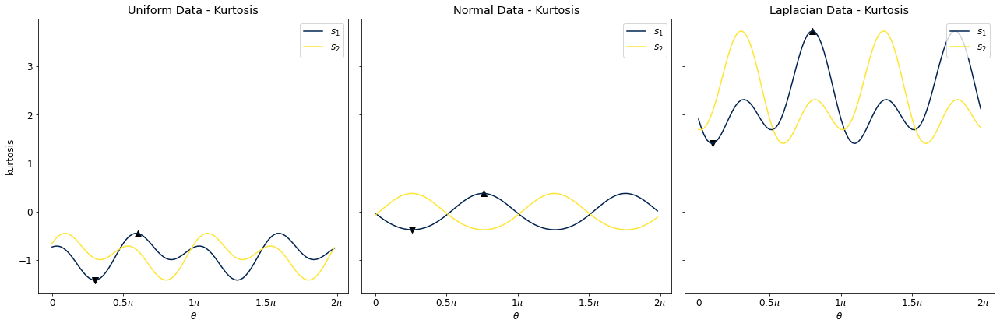

In [18]:
fig, axs = plt.subplots(1,3, figsize=(18, 6), sharey=True)
kurtosis_titles = ['Uniform Data - Kurtosis', 'Normal Data - Kurtosis', 'Laplacian Data - Kurtosis']
for i in range(np.shape(x_theta)[1]):  # loop over data sets
    for j in range(np.shape(x_theta)[2]):  # loop over sources
        cmap = plt.cm.get_cmap('cividis')
        axs[i].plot(theta, kurtosis[i][j], label='$s_%i$' %(j+1), color=cmap(j*0.99))
    axs[i].scatter(theta[kurt_min[i]], kurtosis[i][0][kurt_min[i]], color='k', marker='v', s=2**6)  # min point
    axs[i].scatter(theta[kurt_max[i]], kurtosis[i][0][kurt_max[i]], color='k', marker='^', s=2**6)  # max point
    axs[i].set_title(kurtosis_titles[i])
    axs[i].set_xlabel(r'$\theta$')
    axs[0].set_ylabel(r'kurtosis')
    axs[i].xaxis.set_major_formatter(FuncFormatter(lambda val, pos: '{:.2g}$\pi$'.format(val/np.pi) if val != 0 else '0'))
    axs[i].xaxis.set_major_locator(MultipleLocator(base = 0.5*np.pi))
    axs[i].legend(loc=1)
plt.tight_layout()
plt.show()

In [19]:
min_rotation = [[theta[i] + theta[kurt_min[j]] for i in range(len(theta))] for j in range(3)]
max_rotation = [[theta[i] + theta[kurt_max[j]] for i in range(len(theta))] for j in range(3)]
max_minus_min = [kurt_max[i] - kurt_min[i] for i in range(3)]  # difference between max and min in index points
max_minus_min_rotation = [[theta[i] + theta[max_minus_min[j]] for i in range(len(theta))] for j in range(3)]
rotation = [min_rotation, max_rotation, max_minus_min_rotation]  # theta values here
print(np.shape(min_rotation), np.shape(max_rotation))

(3, 100) (3, 100)


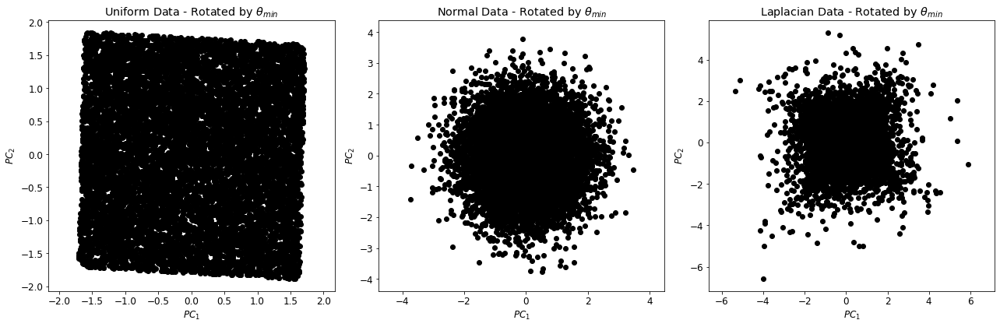

In [20]:
fig, axs = plt.subplots(1,3, figsize=(18, 6))
whitened_titles = [r'Uniform Data - Rotated by $\theta_{min}$', r'Normal Data - Rotated by $\theta_{min}$', r'Laplacian Data - Rotated by $\theta_{min}$']
rotated_min = [[], [], []]
for i in range(np.shape(x_theta)[1]):  # loop over data sets
    rotated_min[i] = [x_theta[kurt_min[i]][i][0], x_theta[kurt_min[i]][i][1]]
    axs[i].scatter(rotated_min[i][0], rotated_min[i][1], color='k')
    axs[i].set_title(whitened_titles[i])
    axs[i].set_xlabel('$PC_1$')
    axs[i].set_ylabel('$PC_2$')
    axs[i].set_aspect('equal', 'datalim')
plt.tight_layout()
plt.show()

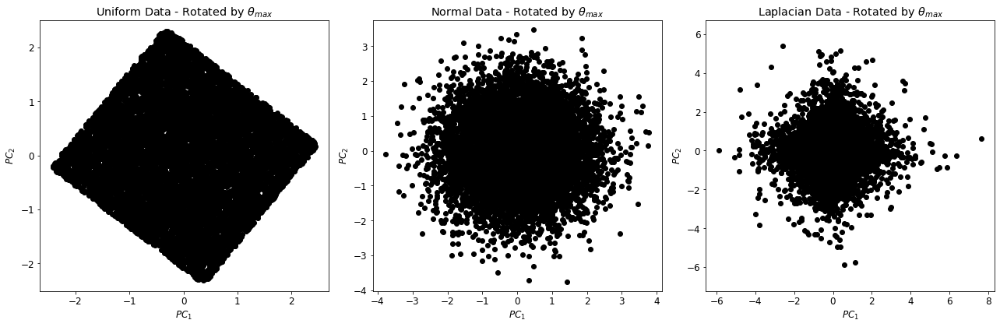

In [21]:
fig, axs = plt.subplots(1,3, figsize=(18, 6))
whitened_titles = [r'Uniform Data - Rotated by $\theta_{max}$', r'Normal Data - Rotated by $\theta_{max}$', r'Laplacian Data - Rotated by $\theta_{max}$']
for i in range(np.shape(x_theta)[1]):  # loop over data sets
    rotated_max = [x_theta[kurt_max[i]][i][0], x_theta[kurt_max[i]][i][1]]
    axs[i].scatter(rotated_max[0], rotated_max[1], color='k')
    axs[i].set_title(whitened_titles[i])
    axs[i].set_xlabel('$PC_1$')
    axs[i].set_ylabel('$PC_2$')
    axs[i].set_aspect('equal', 'datalim')
plt.tight_layout()
plt.show()

### Plot the original dataset (sources) and the mixtures after the steps (a), (b), (c), (d), and (f) as a scatter plot and display the respective marginal histograms.

See above plots for only the scatters, and below for marginal histograms added.

Attempted to create subplots of the marginal histograms with matplotlib, but was unsuccessful.  
Got a bit frustrated, and decided to use the following function taken from this discussion:  
https://stackoverflow.com/questions/35920885/how-to-overlay-a-seaborn-jointplot-with-a-marginal-distribution-histogram-fr

In [22]:
def multivariateGrid(col_x, col_y, col_k, df, k_is_color=False, scatter_alpha=.5):
    def colored_scatter(x, y, c=None):
        def scatter(*args, **kwargs):
            args = (x, y)
            if c is not None:
                kwargs['c'] = c
            kwargs['alpha'] = scatter_alpha
            plt.scatter(*args, **kwargs)
            #plt.set_aspect('equal', 'datalim')

        return scatter

    g = sns.JointGrid(
        x=col_x,
        y=col_y,
        data=df
    )
    color = None
    legends=[]
    for name, df_group in df.groupby(col_k):
        legends.append(name)
        if k_is_color:
            color=name
        g.plot_joint(
            colored_scatter(df_group[col_x],df_group[col_y],color),
        )
        sns.distplot(
            df_group[col_x].values,
            ax=g.ax_marg_x,
            color=color,
        )
        sns.distplot(
            df_group[col_y].values,
            ax=g.ax_marg_y,
            color=color,            
            vertical=True
        )
    # Do also global Hist:
    sns.distplot(
        df[col_x].values,
        ax=g.ax_marg_x,
        color='grey'
    )
    sns.distplot(
        df[col_y].values.ravel(),
        ax=g.ax_marg_y,
        color='grey',
        vertical=True
    )
    plt.legend(legends)

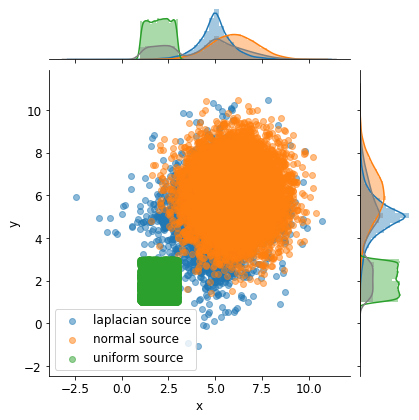

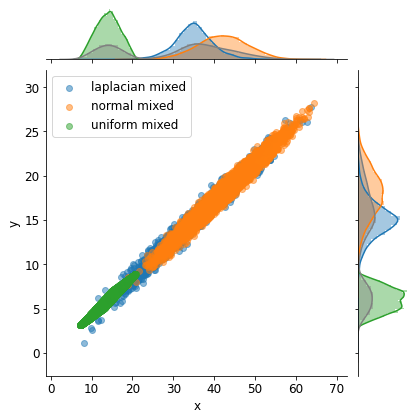

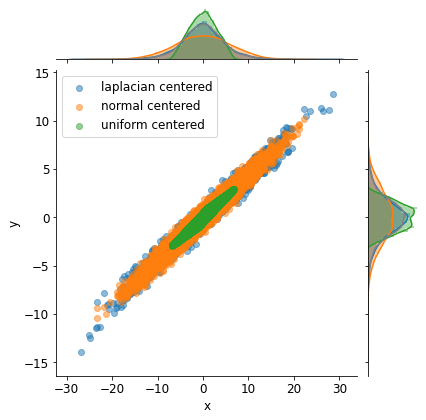

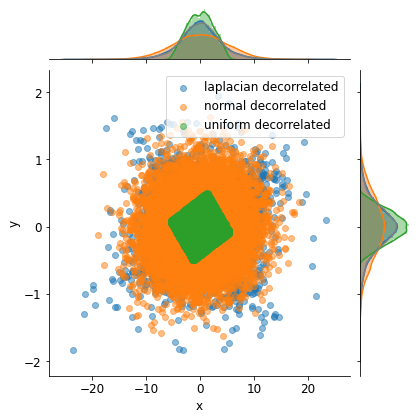

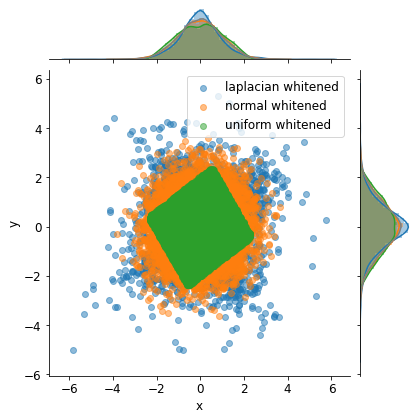

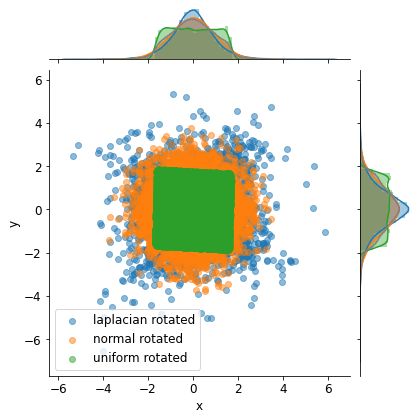

In [23]:
# plot the original data sets
df11 = pd.DataFrame(uniform_data.T, columns=['x','y'])
df21 = pd.DataFrame(normal_data.T, columns=['x','y'])
df31 = pd.DataFrame(laplacian_data.T, columns=['x','y'])
df11['kind'] = 'uniform source'
df21['kind'] = 'normal source'
df31['kind'] = 'laplacian source'
df1 = pd.concat([df11,df21,df31])

# plot the initial mixed data
df12 = pd.DataFrame(uniform_mixed.T, columns=['x','y'])
df22 = pd.DataFrame(normal_mixed.T, columns=['x','y'])
df32 = pd.DataFrame(laplacian_mixed.T, columns=['x','y'])
df12['kind'] = 'uniform mixed'
df22['kind'] = 'normal mixed'
df32['kind'] = 'laplacian mixed'
df2 = pd.concat([df12,df22,df32])

# plot the centered data
df13 = pd.DataFrame(np.transpose(uniform_centered), columns=['x','y'])
df23 = pd.DataFrame(np.transpose(normal_centered), columns=['x','y'])
df33 = pd.DataFrame(np.transpose(laplacian_centered), columns=['x','y'])
df13['kind'] = 'uniform centered'
df23['kind'] = 'normal centered'
df33['kind'] = 'laplacian centered'
df3 = pd.concat([df13,df23,df33])

# plot the decorrelated data
df14 = pd.DataFrame(uniform_PCA.T, columns=['x','y'])
df24 = pd.DataFrame(normal_PCA.T, columns=['x','y'])
df34 = pd.DataFrame(laplacian_PCA.T, columns=['x','y'])
df14['kind'] = 'uniform decorrelated'
df24['kind'] = 'normal decorrelated'
df34['kind'] = 'laplacian decorrelated'
df4 = pd.concat([df14,df24,df34])

# plot the whitened data
df15 = pd.DataFrame(np.transpose(uniform_whitened), columns=['x','y'])
df25 = pd.DataFrame(np.transpose(normal_whitened), columns=['x','y'])
df35 = pd.DataFrame(np.transpose(laplacian_whitened), columns=['x','y'])
df15['kind'] = 'uniform whitened'
df25['kind'] = 'normal whitened'
df35['kind'] = 'laplacian whitened'
df5 = pd.concat([df15,df25,df35])

# plot the rotated data
df16 = pd.DataFrame(np.transpose(rotated_min[0]), columns=['x','y'])
df26 = pd.DataFrame(np.transpose(rotated_min[1]), columns=['x','y'])
df36 = pd.DataFrame(np.transpose(rotated_min[2]), columns=['x','y'])
df16['kind'] = 'uniform rotated'
df26['kind'] = 'normal rotated'
df36['kind'] = 'laplacian rotated'
df6 = pd.concat([df16,df26,df36])

#fig, axs = plt.subplots(2,3, figsize=(18, 12))
multivariateGrid('x', 'y', 'kind', df=df1)
multivariateGrid('x', 'y', 'kind', df=df2)
multivariateGrid('x', 'y', 'kind', df=df3)
multivariateGrid('x', 'y', 'kind', df=df4)
multivariateGrid('x', 'y', 'kind', df=df5)
multivariateGrid('x', 'y', 'kind', df=df6)

Tried to get these Pandas plots into plt subplots, but was not able to troubleshoot the problem.

Neverless, we have achieved maximum non-gaussianity through this procedure.

### For step (e) plot the kurtosis value $kurt(x_θ)$ of each dimension in $\bar{x}$ as a function of the rotation angle $θ$ for each dimension.

See above plots in (e).

### Compare the histograms after rotation by $θ_{min}$ and $θ_{max}$ for the different distributions.

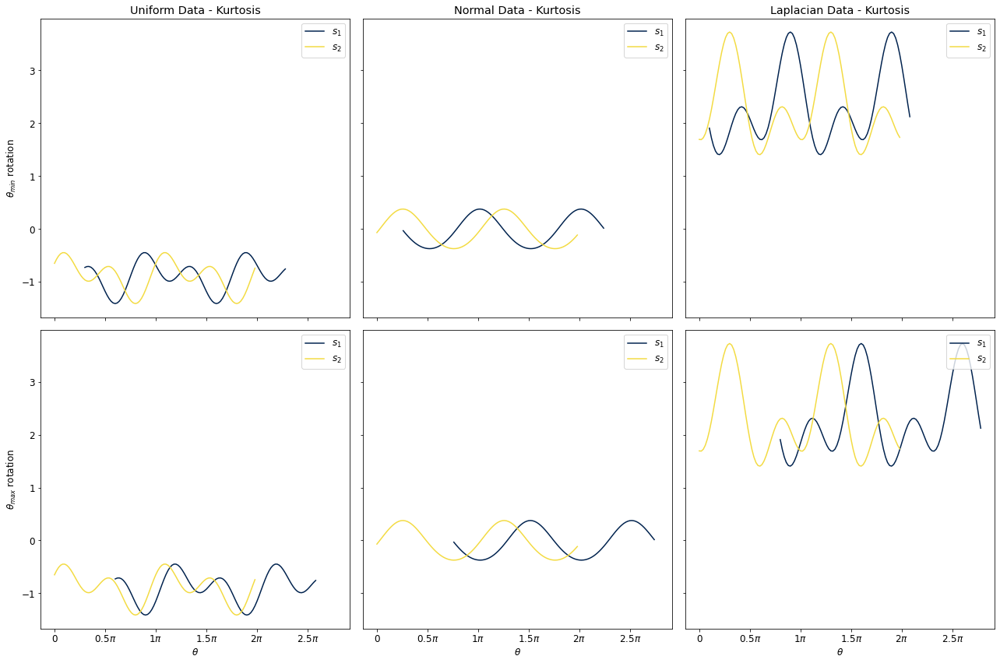

In [24]:
fig, axs = plt.subplots(3-1,3, figsize=(18, 12), sharey=True, sharex=True)
kurtosis_titles = ['Uniform Data - Kurtosis', 'Normal Data - Kurtosis', 'Laplacian Data - Kurtosis']
rotation_titles = [r'$\theta_{min}$ rotation', r'$\theta_{max}$ rotation', r'$\theta{max}-\theta_{min}$ rotation']
for i in range(np.shape(x_theta)[1]):  # loop over data sets
    for j in range(np.shape(x_theta)[2]):  # loop over sources
        cmap = plt.cm.get_cmap('cividis')
        for k in range(np.shape(rotation)[0]-1):  # loop over rotation
            if j == 0:  # rotate
                axs[k,i].plot(rotation[k][i], kurtosis[i][j], label='$s_%i$' %(j+1), color=cmap(j*0.95))
            else:  # don't rotate
                axs[k,i].plot(theta, kurtosis[i][j], label='$s_%i$' %(j+1), color=cmap(j*0.95))
            axs[0,i].set_title(kurtosis_titles[i])
            axs[2-1,i].set_xlabel(r'$\theta$')
            axs[k,0].set_ylabel(rotation_titles[k])
            axs[k,i].xaxis.set_major_formatter(FuncFormatter(lambda val, pos: '{:.2g}$\pi$'.format(val/np.pi) if val != 0 else '0'))
            axs[k,i].xaxis.set_major_locator(MultipleLocator(base = 0.5*np.pi))
            axs[k,i].legend(loc=1)
plt.tight_layout()
plt.show()

## Exercise 6.2: Negentropy is scale-invariant

### Show that the negentropy is invariant w.r.t. to an invertible ($det \bar{A} \neq 0$) linear transformations $\bar{y} = \bar{A} \bar{x}$, i.e. $J(\bar{A} \bar{X}) = J(\bar{X})$, from which it follows that the negentropy is scale-invariant.

### Use that the differential entropy of a multivariate $N$-dimensional Gaussian random vector $\bar{X}$ with covariance matrix $\bar{Σ}$ has the form $H(\bar{X}_{Gauss}) = \frac{1}{2} log | det \bar{Σ} | + \frac{N}{2} (1 + log \ 2π)$. Differential entropy itself is not scale-invariant.

With $\bar{A}$ being an invertible matrix ($∀ A \neq 0$), 

## <font color='black'> $ J(\bar{A} \bar{X}) = H(\bar{X}_{Gauss}) - H(\bar{A} \bar{X}) $

## <font color='black'> $ J(\bar{A} \bar{X}) = \frac{1}{2} log | det \bar{Σ} | + \frac{N}{2} (1 + log \ 2π) - H(\bar{A} \bar{X}) $

where,

## <font color='black'> $ H(\bar{X}) = − \int_{\rm I\!R^N}  p(\bar{x}) \ log \ p(\bar{x})  d\bar{x} $

thus,

## <font color='black'> $ J(\bar{A} \bar{X}) = \bar{A} (\frac{1}{2} log | det \bar{Σ} | + \frac{N}{2} (1 + log \ 2π)) + \int_{\rm I\!R^N}  p(\bar{a} \bar{x}) \ log \ p(\bar{a} \bar{x})  d\bar{x} $

where this should go back to equaling the eq. of $J(\bar{X})$. Let's show this with code:

In [25]:
def negentropy(H_gauss, H, X):
    return H_gauss(X) - H(X)

H_gauss = lambda X_gauss: 0.5 * np.log(abs(np.cov(X_gauss))) + (N/2) * (1 + np.log(2*np.pi))
H = lambda X: - norm.pdf(X) * np.log(norm.pdf(X))
J = lambda H_gauss, H_X: H_gauss - H_X

In [26]:
np.random.seed(111)
N = 10000  # number of dimensions
X = np.random.uniform(-1, 1, N)
X_gauss = mnorm.pdf(x=np.linspace(-1, 1, N), cov=np.cov(X))  # multivariate normal
print(np.shape(X), np.shape(X_gauss))
print(np.cov(X))
print(np.cov(X_gauss))

(10000,) (10000,)
0.33296108379542283
0.030783507998821978


First without the invariant $\bar{A}$.

In [30]:
H_X = np.mean(H(X)) / N  # integrate H
H_g = H_gauss(X_gauss)
print(H_X, H_g)
print(J(H_g, H_X))

3.6338623389624416e-05 14187.64494395323
14187.644907614607


Now with the invariant $\bar{A}$.

In [31]:
A = 0.5  # scale by something
H_X = np.mean(H(A*X)) / N
H_g = H_gauss(A*X_gauss)
print(H_X, H_g)
print(J(H_g, H_X))

3.673153837367698e-05 14186.95179677267
14186.951760041131


Thus, despite us scaling the differential entropy by a factor of one half, the result is practically the same. This tells us that the negentropy is scale-invariant. 

(Not sure if how I did this was the proper way to do this. Analytically, I was confused by how to proceed from above.)